# Deep Reinforcement Learning Laboratory

In this laboratory session we will work on getting more advanced versions of Deep Reinforcement Learning algorithms up and running. Deep Reinforcement Learning is **hard**, and getting agents to stably train can be frustrating and requires quite a bit of subtlety in analysis of intermediate results. We will start by refactoring (a bit) my implementation of `REINFORCE` on the [Cartpole environment](https://gymnasium.farama.org/environments/classic_control/cart_pole/).

## Google Colab Setup


In [ ]:
!pip install swig #required to run lunar lander
!pip install gymnasium[all]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.8/211.8 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manyli

In [ ]:
#if using colab
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: 

## Exercise 1: Improving my `REINFORCE` Implementation (warm up)

In this exercise I improved some aspects of the initial basic `REINFORCE` implementation.


In [ ]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm
from torch.distributions import Categorical

ModuleNotFoundError: No module named 'gymnasium'

In [ ]:
env_render = gym.make('CartPole-v1', render_mode='human')
env = gym.make('CartPole-v1')

In [ ]:
(s0, info) = env.reset()

# Observation space tells us the dimensions and limits of X.
print(f'X: {env.observation_space}')#position, velocity, pole angle, pole angular velocity


# Action spate
print(f'A: {env.action_space}') #push to the left, push to the right

X: Box([-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38], (4,), float32)
A: Discrete(2)


**First**: All of the utility functions for selecting actions and running episodes.

In [ ]:
# Given an environment, observation, and policy, sample from pi(a | obs). Returns the
# selected action and the log probability of that action (needed for policy gradient).
def select_action(obs, policy):
    dist = Categorical(policy(obs))
    action = dist.sample()
    log_prob = dist.log_prob(action)
    return (action.item(), log_prob.reshape(1))

# Utility to compute the discounted total reward. Torch doesn't like flipped arrays, so we need to
# .copy() the final numpy array. There's probably a better way to do this.
def compute_returns(rewards, gamma):
    return np.flip(np.cumsum([gamma**(i+1)*r for (i, r) in enumerate(rewards)][::-1]), 0).copy()

# Given an environment and a policy, run it up to the maximum number of steps.
def run_episode(env, policy, maxlen=500):
    # Collect just about everything.
    observations = []
    actions = []
    log_probs = []
    rewards = []

    # Reset the environment and start the episode.
    (obs, info) = env.reset()
    for i in range(maxlen):
        # Get the current observation, run the policy and select an action.
        obs = torch.tensor(obs)
        (action, log_prob) = select_action(obs, policy)
        observations.append(obs)
        actions.append(action)
        log_probs.append(log_prob)
        # Advance the episode by executing the selected action.
        (obs, reward, term, trunc, _) = env.step(action)
        rewards.append(reward)
        if term or trunc:
            break
    return (observations, actions, torch.cat(log_probs), rewards)

**Next**: My own implementation of `REINFORCE`.

In [ ]:
# A direct, inefficient, and probably buggy of the REINFORCE policy gradient algorithm.
def reinforce(policy, env, env_render=None, gamma=0.99, num_episodes=10, display=False, lr=1e-2, eval_episodes=10, eval_update_frequency=50, baseline=True, comment=''):
    # The only non-vanilla part: we use Adam instead of SGD.
    opt = torch.optim.Adam(policy.parameters(), lr=lr)

    # Track episode rewards in a list.
    running_rewards = [0.0]
    average_rewards = []
    avg_lenghts = []

    # The main training loop.
    policy.train()
    for episode in tqdm(range(num_episodes)):
        # Run an episode of the environment, collect everything needed for policy update.
        (observations, actions, log_probs, rewards) = run_episode(env, policy)

        # Compute the discounted reward for every step of the episode.
        returns = torch.tensor(compute_returns(rewards, gamma), dtype=torch.float32)

        # Keep a running average of total discounted rewards for the whole episode.
        running_rewards.append(0.05 * returns[0].item() + 0.95 * running_rewards[-1])
        #writer.add_scalar('Running', running_rewards[-1], episode)

        # Standardize returns.
        returns = (returns - returns.mean()) / returns.std()

        # Make an optimization step
        opt.zero_grad()
        loss = (-log_probs * returns).mean()
        loss.backward()
        opt.step()

        # Render an episode after every 100 policy updates.
        if not episode % eval_update_frequency:
            policy.eval()
            episode_length = 0
            total_reward = 0
            for _ in range(eval_episodes):
                (_, _, _, rewards) = run_episode(env, policy)
                total_reward += sum(rewards)
                episode_length += len(rewards)
            average_rewards.append(total_reward / eval_episodes)
            avg_lenghts.append(episode_length / eval_episodes)
            policy.train()

    # Return the running rewards.
    policy.eval()
    return (running_rewards, average_rewards, avg_lenghts)

**Next**: Define a very simple agent.

In [ ]:
class PolicyNet(nn.Module):
    def __init__(self, env, inner_size):
        super().__init__()
        self.fc1 = nn.Linear(env.observation_space.shape[0], inner_size)
        self.fc2 = nn.Linear(inner_size, env.action_space.n)
        self.relu = nn.ReLU()

    def forward(self, s):
        s = F.relu(self.fc1(s))
        s = F.softmax(self.fc2(s), dim=-1)
        return s

**At Last**: See if it works!

100%|██████████| 1000/1000 [08:15<00:00,  2.02it/s]


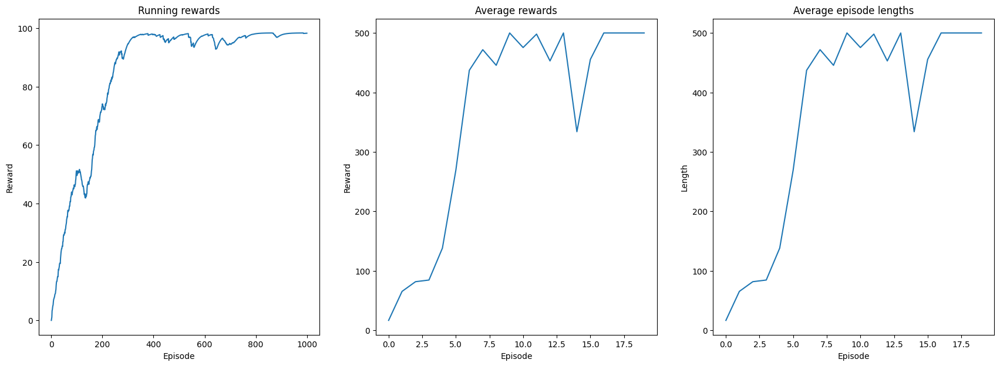

In [ ]:
env = gym.make('CartPole-v1')
env_render = gym.make('CartPole-v1', render_mode='human')

# Make a policy network.
policy = PolicyNet(env, inner_size=32)

# Train the agent.
lr = 1e-2
(running_rewards, average_rewards, average_len) = reinforce(policy, env, env_render,lr=lr, num_episodes=1000, baseline=False)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/policy_cartpole.pt'
torch.save(policy.state_dict(), PATH)
# Close up everything
env_render.close()
env.close()

**Results:** This is a simulation using the policy net trained for 1000 episodes:






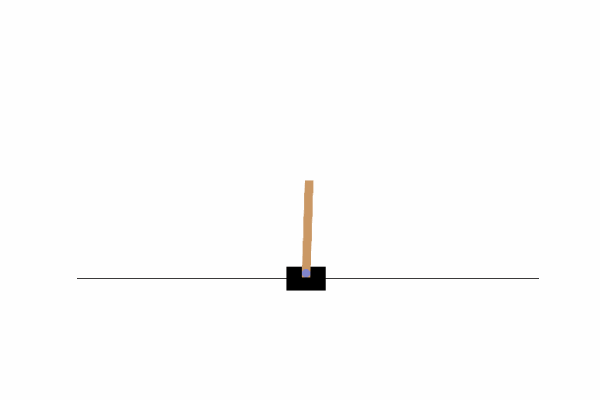

**Improving the policy**:
I found that giving a little smaller learning rate and more iterations (from 1000 to 1500) helps to make it reach convergence.
So by going from 1e-2 to 5e-3 the results get better as shown in the pictures.
Also the animation shows a slightly better results since it is never going too far from the center.



100%|██████████| 1500/1500 [12:50<00:00,  1.95it/s]


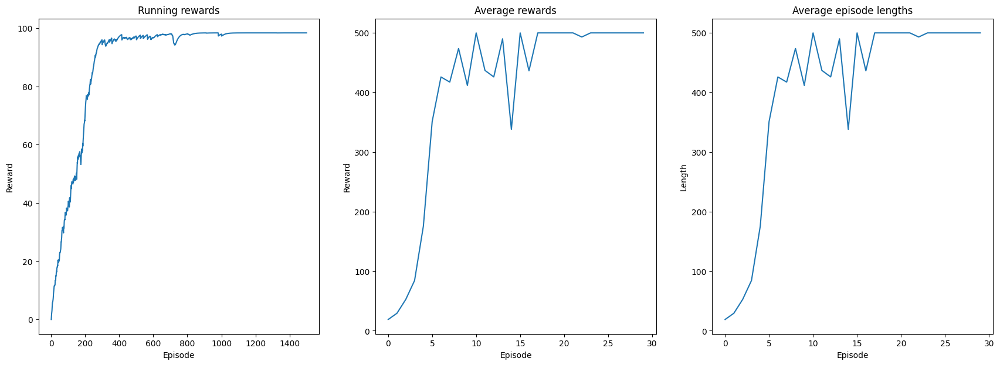

In [ ]:
env = gym.make('CartPole-v1')
env_render = gym.make('CartPole-v1', render_mode='human')

# Make a policy network.
policy = PolicyNet(env, inner_size=32)

# Train the agent.
lr = 5e-3
(running_rewards, average_rewards, average_len) = reinforce(policy, env, env_render,lr=lr, num_episodes=1500, baseline=False)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/policy_lowerlr.pt'
torch.save(policy.state_dict(), PATH)
# Close up everything
env_render.close()
env.close()

**Results:** This is a simulation using the policy net trained for 1500 episodes and a smaller learning rate:

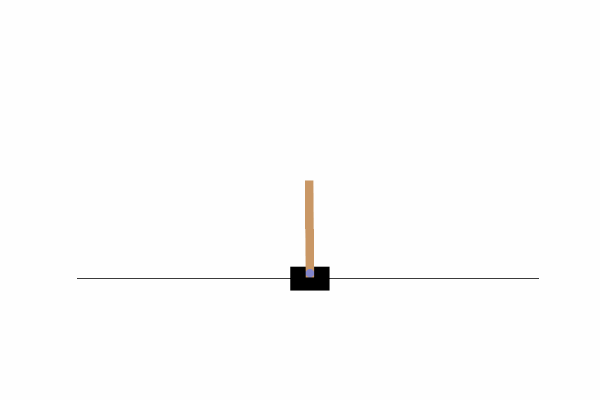

-----
## Exercise 2: `REINFORCE` with a Value Baseline (warm up)

In this exercise I improved my implementation of `REINFORCE` to subtract a baseline from the target in the update equation in order to stabilize (and hopefully speed-up) convergence.



**First Things First**: Recall that we can **subtract** any function that doesn't depend on the current action from the q-value without changing the (maximum of our) objecttive function $J$:  

$$ \nabla J(\boldsymbol{\theta}) \propto \sum_{s} \mu(s) \sum_a \left( q_{\pi}(s, a) - b(s) \right) \nabla \pi(a \mid s, \boldsymbol{\theta}) $$

In `REINFORCE` this means we can subtract from our target $G_t$:

$$ \boldsymbol{\theta}_{t+1} \triangleq \boldsymbol{\theta}_t + \alpha (G_t - b(S_t)) \frac{\nabla \pi(A_t \mid s, \boldsymbol{\theta})}{\pi(A_t \mid s, \boldsymbol{\theta})} $$

Since we are only interested in the **maximum** of our objective, we can also **rescale** our target by any function that also doesn't depend on the action. A **simple baseline** which is even independent of the state -- that is, it is **constant** for each episode -- is to just **standardize rewards within the episode**. So, we **subtract** the average return and **divide** by the variance of returns:

$$ \boldsymbol{\theta}_{t+1} \triangleq \boldsymbol{\theta}_t + \alpha \left(\frac{G_t - \bar{G}}{\sigma_G}\right) \nabla  \pi(A_t \mid s, \boldsymbol{\theta}) $$

This baseline is **already** implemented in my implementation of `REINFORCE`. In the following lines I experimented with and without this standardization baseline and compare the performance.

This is the modified implementation of `REINFORCE`:

In [ ]:
# A direct, inefficient, and probably buggy of the REINFORCE policy gradient algorithm.
def reinforce(policy, env, env_render=None, gamma=0.99, num_episodes=10, display=False, lr=1e-2, eval_episodes=10, eval_update_frequency=50,standardize=True, baseline=True):
    # The only non-vanilla part: we use Adam instead of SGD.
    opt = torch.optim.Adam(policy.parameters(), lr=lr)

    # Track episode rewards in a list.
    running_rewards = [0.0]
    average_rewards = []
    avg_lenghts = []

    # The main training loop.
    policy.train()
    for episode in tqdm(range(num_episodes)):
        # Run an episode of the environment, collect everything needed for policy update.
        (observations, actions, log_probs, rewards) = run_episode(env, policy)

        # Compute the discounted reward for every step of the episode.
        returns = torch.tensor(compute_returns(rewards, gamma), dtype=torch.float32)

        # Keep a running average of total discounted rewards for the whole episode.
        running_rewards.append(0.05 * returns[0].item() + 0.95 * running_rewards[-1])
        #writer.add_scalar('Running', running_rewards[-1], episode)

        # Standardize returns.
        if standardize:
            returns = (returns - returns.mean()) / returns.std()

        # Make an optimization step
        opt.zero_grad()
        loss = (-log_probs * returns).mean()
        loss.backward()
        opt.step()

        # Render an episode after every 100 policy updates.
        if not episode % eval_update_frequency:
            policy.eval()
            episode_length = 0
            total_reward = 0
            for _ in range(eval_episodes):
                (_, _, _, rewards) = run_episode(env, policy)
                total_reward += sum(rewards)
                episode_length += len(rewards)
            average_rewards.append(total_reward / eval_episodes)
            avg_lenghts.append(episode_length / eval_episodes)
            policy.train()

    # Return the running rewards.
    policy.eval()
    return (running_rewards, average_rewards, avg_lenghts)

By running without the standardization that's what happens:

100%|██████████| 1500/1500 [03:42<00:00,  6.75it/s]


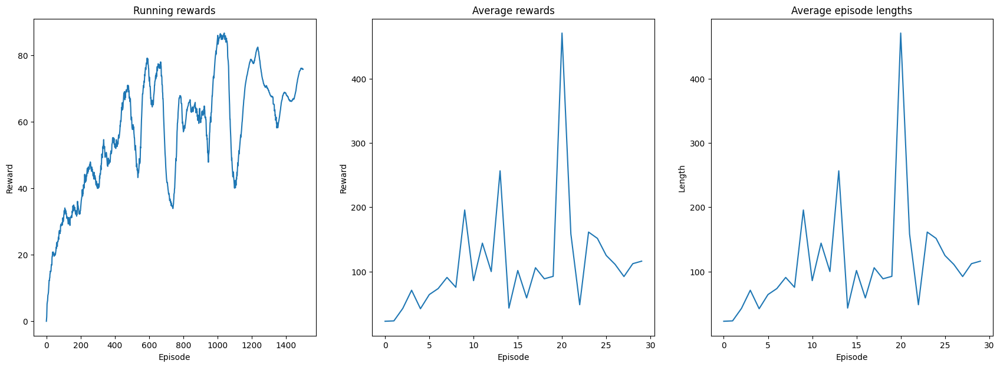

In [ ]:
env = gym.make('CartPole-v1')
standardize = False
lr = 1e-2

# Make a policy network.
policy = PolicyNet(env, inner_size=32)

# Train the agent.
(running_rewards, average_rewards, average_len) = reinforce(policy, env, env_render, num_episodes=1000, lr=lr, standardize=standardize)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

# Run the final agent for shits and giggles.
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/policy_nostd.pt'
torch.save(policy.state_dict(), PATH)

# Close up everything
env.close()

**Results:** The policy becomes very instable:

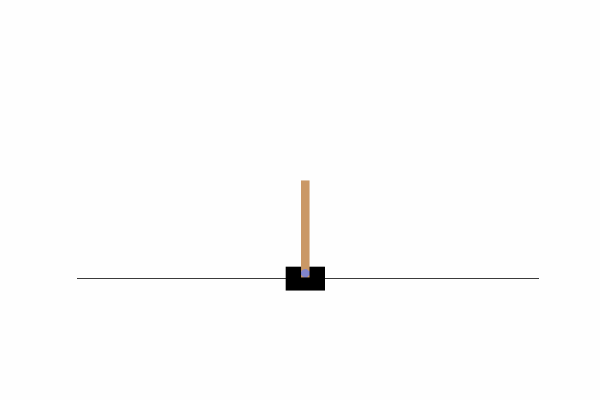

Trying different learning rates doesn't change much as shown in the following lines, proving that the standardization is helping a lot in the `REINFORCE` algorithm.

100%|██████████| 1500/1500 [00:59<00:00, 25.03it/s]


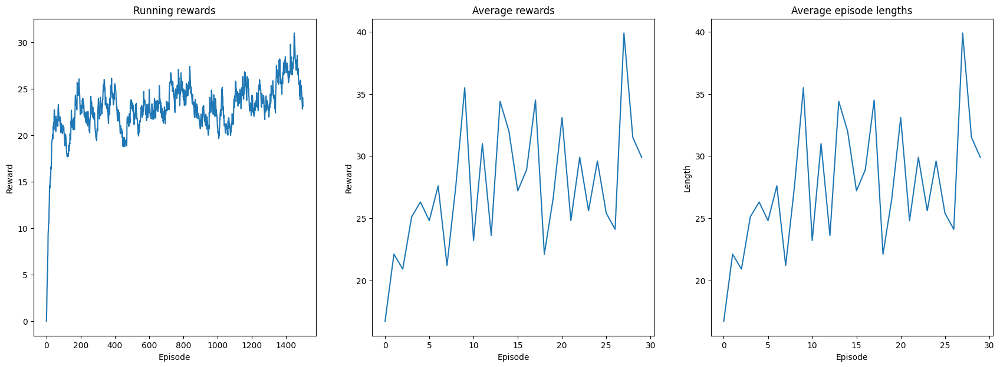

In [ ]:
env = gym.make('CartPole-v1')
standardize = False
lr = 1e-4

# Make a policy network.
policy = PolicyNet(env, inner_size=32)

# Train the agent.
(running_rewards, average_rewards, average_len) = reinforce(policy, env, env_render, num_episodes=1500, lr=lr, standardize=standardize)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

# Run the final agent for shits and giggles.
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/policy_nostd_lowerlr.pt'
torch.save(policy.state_dict(), PATH)

# Close up everything
env.close()

## Exercise 2.1: The Real Exercise:
Standard practice is to use the state-value function $v(s)$ as a baseline. This is intuitively appealing -- we are more interested in updating out policy for returns that estimate the current **value** worse. Our new update becomes:

$$ \boldsymbol{\theta}_{t+1} \triangleq \boldsymbol{\theta}_t + \alpha (G_t - \tilde{v}(S_t \mid \mathbf{w})) \frac{\nabla \pi(A_t \mid s, \boldsymbol{\theta})}{\pi(A_t \mid s, \boldsymbol{\theta})} $$

where $\tilde{v}(s \mid \mathbf{w})$ is a **deep neural network** with parameters $w$ that estimates $v_\pi(s)$. What neural network? Typically, we use the **same** network architecture as that of the Policy.

**Your Task**: Modify your implementation to fit a second, baseline network to estimate the value function and use it as **baseline**.

**Some modification needed:**

We need to:

*   Add the ValueNet class
*   Redefine the run_episode method to return also the ValueNet prediction
*   The `REINFORCE` method to subtract the Values


In [ ]:
class PolicyNet(nn.Module):
    def __init__(self, env, inner_size):
        super().__init__()
        self.fc1 = nn.Linear(env.observation_space.shape[0], inner_size)
        self.fc2 = nn.Linear(inner_size, env.action_space.n)
        self.relu = nn.ReLU()

    def forward(self, s):
        s = F.relu(self.fc1(s))
        s = F.softmax(self.fc2(s), dim=-1)
        return s

class ValueNet(nn.Module):
    def __init__(self, env, inner_size):
        super().__init__()
        self.fc1 = nn.Linear(env.observation_space.shape[0], inner_size)
        self.fc2 = nn.Linear(inner_size, 1)
        self.relu = nn.ReLU()

    def forward(self, s):
        s = F.relu(self.fc1(s))
        s = self.fc2(s) #it is predicting 1 value
        return s

def run_episode(env, policy, value_net, maxlen=500):
    # Collect just about everything.
    observations = []
    actions = []
    log_probs = []
    rewards = []
    values = []

    # Reset the environment and start the episode.
    (obs, info) = env.reset()
    for i in range(maxlen):
        # Get the current observation, run the policy and select an action.
        obs = torch.tensor(obs)
        value = value_net(obs)
        (action, log_prob) = select_action(obs, policy)
        observations.append(obs)
        actions.append(action)
        log_probs.append(log_prob)
        values.append(value)
        # Advance the episode by executing the selected action.
        (obs, reward, term, trunc, _) = env.step(action)
        rewards.append(reward)
        if term or trunc:
            break
    return (observations, actions, torch.cat(log_probs), rewards, values)

In [ ]:
def reinforce(policy, value_net, env, env_render=None, gamma=0.99, num_episodes=10, display=False, lr=1e-2, lr_value=None, eval_episodes=10, eval_update_frequency=50, standardize=True, baseline=True):
    opt = torch.optim.Adam(policy.parameters(), lr=lr)
    if lr_value is None:
        lr_value = lr
    opt_value_net = torch.optim.Adam(policy.parameters(), lr=lr_value)

    # Track episode rewards in a list.
    running_rewards = [0.0]
    average_rewards = []
    avg_lenghts = []

    # The main training loop.
    policy.train()
    for episode in tqdm(range(num_episodes)):
        # Run an episode of the environment, collect everything needed for policy update.
        (observations, actions, log_probs, rewards, values) = run_episode(env, policy, value_net)

        # Compute the discounted reward for every step of the episode.
        returns = torch.tensor(compute_returns(rewards, gamma), dtype=torch.float32)

        # Makes the values a torch tensor to be able to subtract it
        values = torch.tensor(values, dtype=torch.float32)

        # Keep a running average of total discounted rewards for the whole episode.
        running_rewards.append(0.05 * returns[0].item() + 0.95 * running_rewards[-1])

        # Standardize returns.
        if standardize:
            returns = (returns - returns.mean()) / returns.std()

        # Make an optimization step
        targets = returns - values

        opt.zero_grad()
        opt_value_net.zero_grad()
        loss = (-log_probs * targets).mean()
        loss_value = F.mse_loss(returns, values)
        loss_value.requires_grad = True
        loss_value.backward()
        opt_value_net.step()
        loss += loss_value
        loss.backward()
        opt.step()

        # Render an episode after every eval_update_frequency iterations
        if not episode % eval_update_frequency:
            policy.eval()
            value_net.eval()
            episode_length = 0
            total_reward = 0
            for _ in range(eval_episodes):
                (_, _, _, rewards, _) = run_episode(env, policy, value_net)
                total_reward += sum(rewards)
                episode_length += len(rewards)
            average_rewards.append(total_reward / eval_episodes)
            avg_lenghts.append(episode_length / eval_episodes)
            policy.train()
            value_net.train()


    # Return the running rewards.
    policy.eval()
    value_net.eval()
    return (running_rewards, average_rewards, avg_lenghts)

**The run:** I gave just 400 episodes and it was enough for the policy to learn

100%|██████████| 400/400 [02:32<00:00,  2.62it/s]


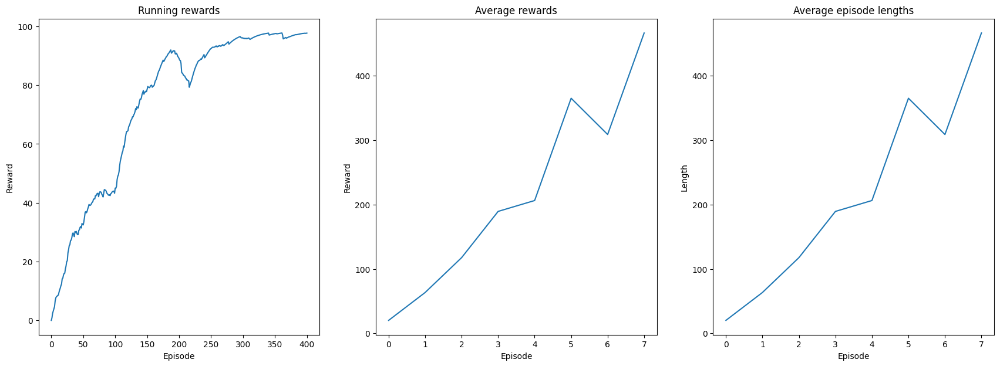

In [ ]:
env = gym.make('CartPole-v1')
standardize = True
lr = 1e-2

# Make a policy network.
policy = PolicyNet(env, inner_size=32)
value_net = ValueNet(env, inner_size=32)

# Train the agent.
(running_rewards, average_rewards, average_len) = reinforce(policy, value_net, env, env_render, num_episodes=400, lr=lr, standardize=standardize)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

# Run the final agent for shits and giggles.
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/policy_value.pt'
torch.save(policy.state_dict(), PATH)

# Close up everything
env.close()

The simulation looks **qualitatively worst** than the others but it still gets to the 500th step resulting in a success. On the other hand considering the training time which went from 1500 to 400 episodes this looks like a good **trade-off between training time and quality** of the trained model.

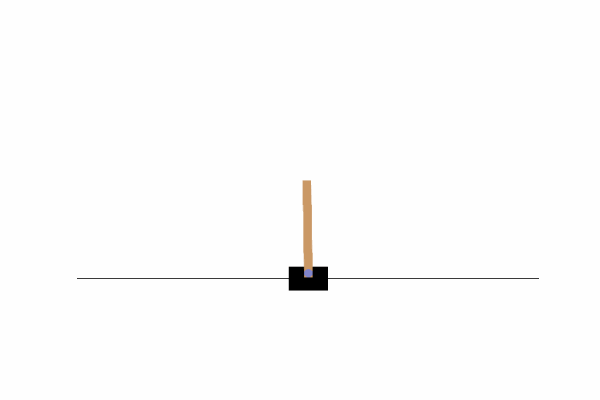

-----
## Exercise 3: Going Deeper

### Exercise 3.1: Solving Lunar Lander with `REINFORCE` (easy)

I used my implementation of `REINFORCE` to solve the [Lunar Lander Environment](https://gymnasium.farama.org/environments/box2d/lunar_lander/). This environment is a little bit harder than Cartpole.



In [ ]:
class PolicyNet(nn.Module):
    def __init__(self, env, inner_size):
        super().__init__()
        self.fc1 = nn.Linear(env.observation_space.shape[0], inner_size*2)
        self.fc2 = nn.Linear(inner_size*2, inner_size)
        self.fc3 = nn.Linear(inner_size, env.action_space.n)
        self.relu = nn.ReLU()

    def forward(self, s):
        s = F.relu(self.fc1(s))
        s = F.relu(self.fc2(s))
        s = F.softmax(self.fc3(s), dim=-1)
        return s

class ValueNet(nn.Module):
    def __init__(self, env, inner_size):
        super().__init__()
        self.fc1 = nn.Linear(env.observation_space.shape[0], inner_size)
        self.fc2 = nn.Linear(inner_size, 1)
        self.relu = nn.ReLU()

    def forward(self, s):
        s = F.relu(self.fc1(s))
        s = self.fc2(s) #it is predicting 1 value
        return s

**Greater instability:** Trying to solve [Lunar Lander Environment](https://gymnasium.farama.org/environments/box2d/lunar_lander/) the first thing I noticed is a greater instability in training as some runs immediately start having very short episodes and end up very fast with a very bad policy as shown here:

100%|██████████| 4000/4000 [17:00<00:00,  3.92it/s]


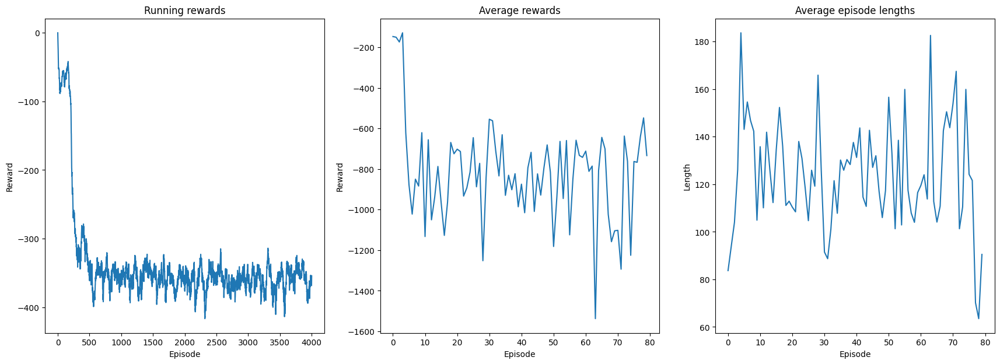

In [ ]:
env = gym.make('LunarLander-v2')
standardize = True
lr = 2e-3

# Make a policy network.
policy = PolicyNet(env, inner_size=64)
value_net = ValueNet(env, inner_size=64)

# Train the agent.
(running_rewards, average_rewards, average_len) = reinforce(policy, value_net, env, num_episodes=4000, lr=lr, standardize=standardize)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

# Run the final agent for shits and giggles.
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/lunar_lander.pt'
torch.save(policy.state_dict(), PATH)

# Close up everything
env.close()

**Lucky run:** In one of the many runs I tried the policy actually learned something with longer episodes as shown in the episode lenghts plot but still the result is really bad as shown in the simulation.

100%|██████████| 4000/4000 [54:47<00:00,  1.22it/s]


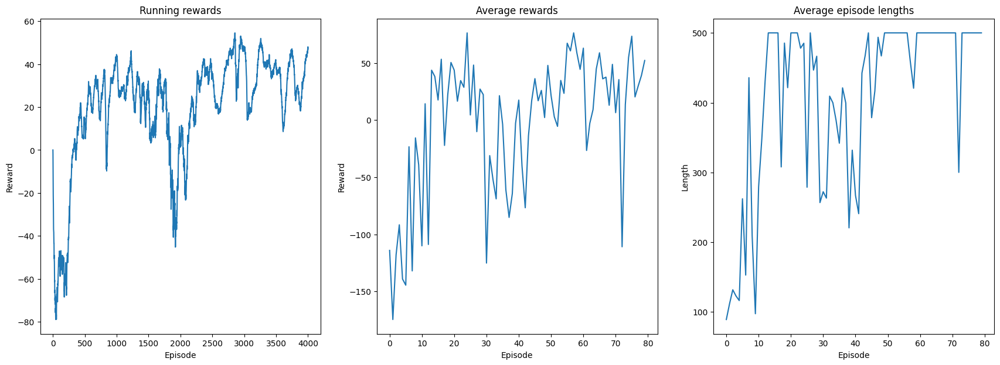

In [ ]:
env = gym.make('LunarLander-v2')
standardize = True
lr = 2e-3

# Make a policy network.
policy = PolicyNet(env, inner_size=64)
value_net = ValueNet(env, inner_size=64)

# Train the agent.
(running_rewards, average_rewards, average_len) = reinforce(policy, value_net, env, num_episodes=4000, lr=lr, standardize=standardize)

fig, axes = plt.subplots(1,3, figsize=(21,7))
axes[0].plot(running_rewards)
axes[0].set_title('Running rewards')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')

axes[1].plot(average_rewards)
axes[1].set_title('Average rewards')
axes[1].set_xlabel('Episode')
axes[1].set_ylabel('Reward')

axes[2].plot(average_len)
axes[2].set_title('Average episode lengths')
axes[2].set_xlabel('Episode')
axes[2].set_ylabel('Length')

# Run the final agent for shits and giggles.
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/lunar_lander_2.pt'
torch.save(policy.state_dict(), PATH)

# Close up everything
env.close()

**Results:** Here's an example of the policy behaviour, without considering all the crashes happening very often:

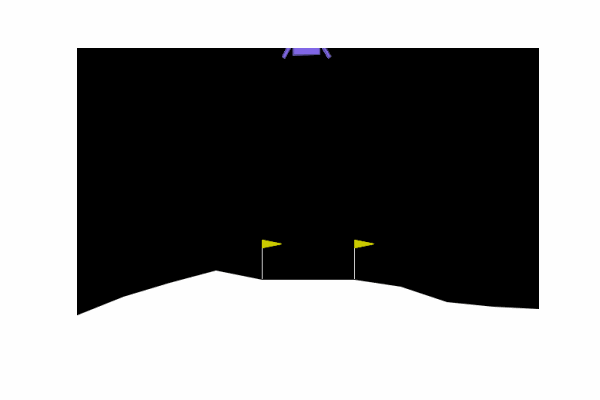

The results of the policy is quite bad.



### Exercise 3.2: Solving Cartpole and Lunar Lander with `Deep Q-Learning` (harder)

On policy Deep Reinforcement Learning tends to be **very unstable**. I tried to adapt an existing implementation of `Deep Q-Learning` from [Medium website](https://medium.com/@hkabhi916/mastering-deep-q-learning-with-pytorch-a-comprehensive-guide-a7e690d644fc).

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
from collections import deque, namedtuple
#import gymnasium as gym

# Define Deep Q-Network (DQN) Model
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [ ]:
# Define DQN Agent with Experience Replay Buffer
class DQNAgent:
    def __init__(self, state_dim, action_dim, lr, gamma, epsilon, epsilon_decay, buffer_size):
        self.state_dim = state_dim
        self.action_dim = action_dim
        self.lr = lr
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.memory = deque(maxlen=buffer_size)
        self.model = DQN(state_dim, action_dim)
        self.optimizer = optim.Adam(self.model.parameters(), lr=lr)

    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return np.random.choice(self.action_dim)
        #schedule epsilon?
        with torch.no_grad():
            q_values = self.model(torch.tensor(state, dtype=torch.float32))
        return torch.argmax(q_values).item()

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, batch_size):
        if len(self.memory) < batch_size:
            return
        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state, done in minibatch:
            target = reward
            if not done:
                target = reward + self.gamma * torch.max(self.model(torch.tensor(next_state, dtype=torch.float32))).item()
            target_f = self.model(torch.tensor(state, dtype=torch.float32)).detach().numpy()
            target_f[action] = target
            self.optimizer.zero_grad()
            loss = nn.MSELoss()(torch.tensor(target_f), self.model(torch.tensor(state, dtype=torch.float32)))
            loss.backward()
            self.optimizer.step()
        if self.epsilon > 0.01:
            self.epsilon *= self.epsilon_decay


In [ ]:
# Initialize environment and agent with Experience Replay Buffer
import gym
env = gym.make("LunarLander-v2")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
agent = DQNAgent(state_dim, action_dim, lr=0.0001, gamma=0.99, epsilon=1.0, epsilon_decay=0.995, buffer_size=10000)

# Train the DQN agent with Experience Replay Buffer
batch_size = 128
num_episodes = 100
for episode in range(num_episodes):
    state = env.reset()
    total_reward = 0
    done = False
    while not done:
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        agent.remember(state, action, reward, next_state, done)
        state = next_state
        total_reward += reward
        agent.replay(batch_size)
    print(f"Episode: {episode + 1}, Total Reward: {total_reward}")


Episode: 1, Total Reward: -209.9912817222193
Episode: 2, Total Reward: -142.7598900243783
Episode: 3, Total Reward: -70.62436127247608
Episode: 4, Total Reward: -222.86742785819135
Episode: 5, Total Reward: -488.7558629249373
Episode: 6, Total Reward: -161.46958957693937
Episode: 7, Total Reward: -399.21056096644384
Episode: 8, Total Reward: -291.42722128131925
Episode: 9, Total Reward: -328.5677497252452
Episode: 10, Total Reward: -335.383542435569
Episode: 11, Total Reward: -293.5913936540258
Episode: 12, Total Reward: -90.16945475668824
Episode: 13, Total Reward: -308.3074769285298
Episode: 14, Total Reward: -182.13332445535667
Episode: 15, Total Reward: -7.872828830829036
Episode: 16, Total Reward: -205.48641567304833
Episode: 17, Total Reward: -190.59823016886605
Episode: 18, Total Reward: -228.1482007859747
Episode: 19, Total Reward: -197.46510327671066
Episode: 20, Total Reward: -233.25924282038238
Episode: 21, Total Reward: -158.92853702895582
Episode: 22, Total Reward: -128.50

The agent most of the times almost makes it but in the end it ends up as a fail...

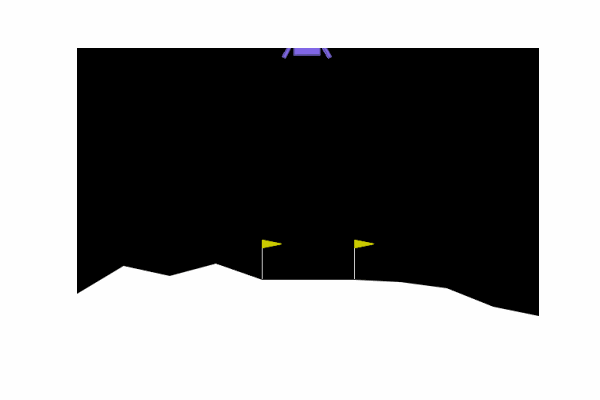

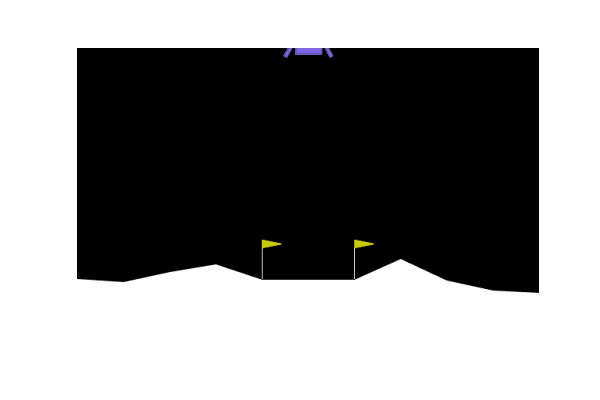

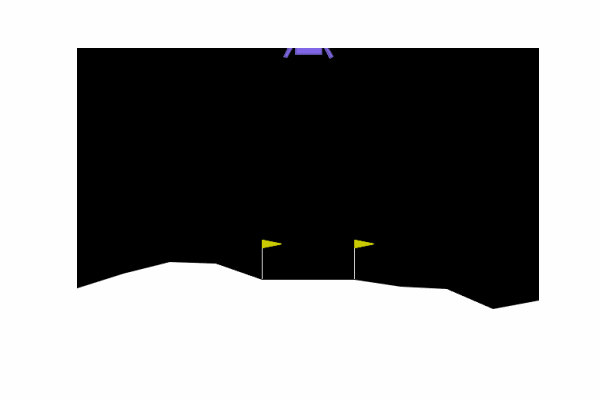

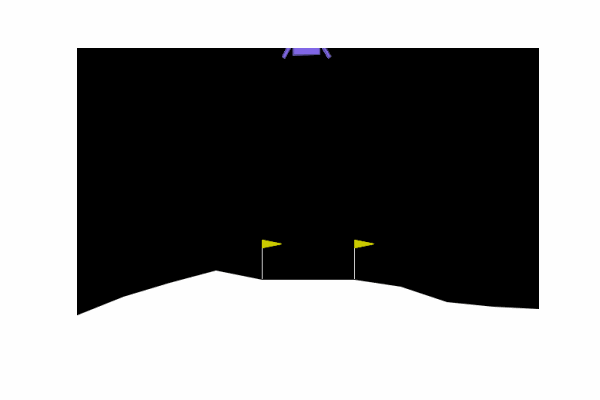

Based on the Medium Implementation I modified it to make it work and to plot more information about the run:

In [ ]:
# Define DQN Agent with Experience Replay Buffer
from collections import deque, namedtuple
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm

Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward'))
class DQNAgent:
    def __init__(self, state_dim, action_dim, lr, gamma, epsilon, epsilon_decay, buffer_size):
        self.state_dim = state_dim
        self.action_dim = action_dim
        self.lr = lr
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.memory = deque(maxlen=buffer_size)
        self.model = DQN(state_dim, action_dim)
        self.target = DQN(state_dim, action_dim)
        self.target.load_state_dict(self.model.state_dict())
        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)

    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return np.random.choice(self.action_dim)
        with torch.no_grad():
            q_values = self.model(torch.tensor(state, dtype=torch.float32))
        return torch.argmax(q_values).item()

    def remember(self, *args):
        self.memory.append(Transition(*args))

    def replay(self, batch_size):
        if len(self.memory) < batch_size:
            return
        batch = random.sample(self.memory, batch_size)
        batch = Transition(*zip(*batch))

        non_final_mask = torch.tensor(tuple(map(lambda s: s is not None,
                                                batch.next_state)), device=device, dtype=torch.bool)
        non_final_next_states = torch.cat([s for s in batch.next_state
                                           if s is not None])
        state_batch = torch.cat(batch.state)
        action_batch = torch.cat(batch.action)
        reward_batch = torch.cat(batch.reward)

        state_action_values = self.model(state_batch).gather(1, action_batch.unsqueeze(1))
        next_state_values = torch.zeros(batch_size, device=device)
        with torch.no_grad():
            next_state_values[non_final_mask] = self.target(non_final_next_states).max(1).values

        # Expected Q values
        expected_state_action_values = (next_state_values * self.gamma) + reward_batch

        self.optimizer.zero_grad()
        criterion = nn.SmoothL1Loss()
        loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))
        loss.backward()

        torch.nn.utils.clip_grad_value_(self.model.parameters(), 100)
        self.optimizer.step()

    def save_model(self, path):
        torch.save(self.model.state_dict(), path)

    def train_model(self, num_episodes, batch_size):
        tau = 0.005
        rewards = []
        epsilons = []
        episode_lenghts = []
        self.epsilon_decrease = self.epsilon_decay / num_episodes
        for episode in tqdm(range(num_episodes)):
            state = env.reset()
            total_reward = 0
            episode_lenght = 0
            done = False
            while not done:
                action = self.act(state)
                episode_lenght += 1
                remember_state = torch.tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
                next_state, reward, done, _ = env.step(action)
                obs = torch.tensor(next_state, dtype=torch.float32, device=device).unsqueeze(0)
                act = torch.tensor([action], device=device, dtype=torch.long)
                rew = torch.tensor([reward], device=device, dtype=torch.long)
                if done:
                  self.remember(remember_state, act, None, rew)
                else:
                  self.remember(remember_state, act, obs, rew)
                state = next_state
                total_reward += reward
                self.replay(batch_size)
                #slow update target
                target_state_dict = self.target.state_dict()
                policy_state_dict = self.model.state_dict()
                for key in policy_state_dict:
                    target_state_dict[key] = policy_state_dict[key] * tau + target_state_dict[key] * (1 - tau)
                self.target.load_state_dict(target_state_dict)
            #print(f"Episode: {episode + 1}, Total Reward: {total_reward}, Epsilon: {self.epsilon}")
            self.epsilon = self.epsilon - self.epsilon_decrease
            rewards.append(total_reward)
            epsilons.append(self.epsilon)
            episode_lenghts.append(episode_lenght)
        plt.plot(rewards)
        plt.xlabel('Episode')
        plt.ylabel('Total Reward')
        plt.show()
        plt.plot(epsilons)
        plt.xlabel('Episode')
        plt.ylabel('Epsilon')
        plt.show()
        plt.plot(episode_lenghts)
        plt.xlabel('Episode')
        plt.ylabel('Episode Length')
        plt.show()

**Results:** These are the results with my modified version:

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
100%|██████████| 5000/5000 [1:48:54<00:00,  1.31s/it]


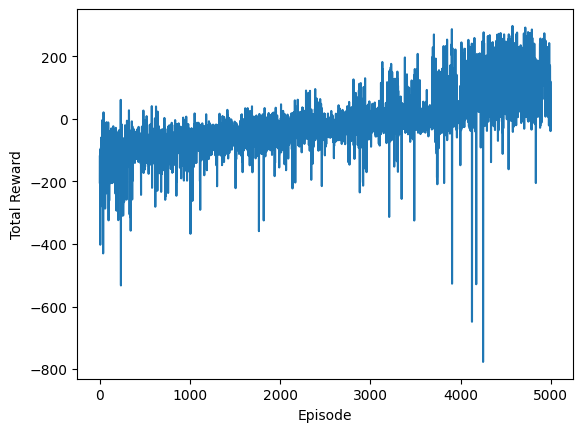

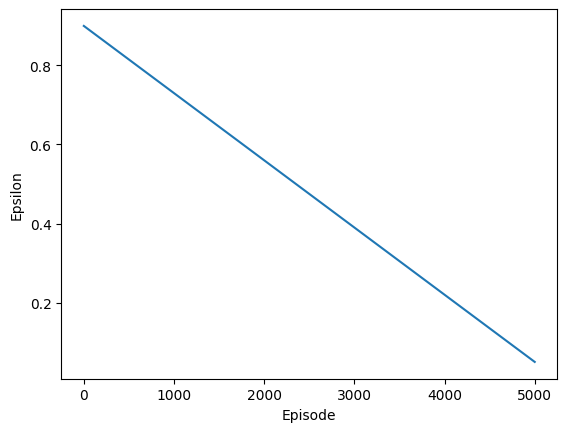

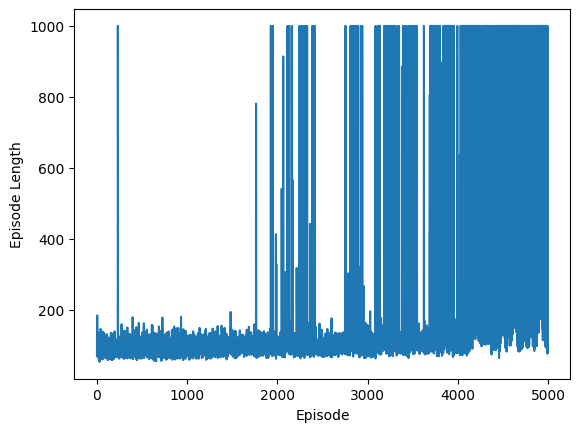

In [ ]:
import gym
env = gym.make("LunarLander-v2")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
agent = DQNAgent(state_dim, action_dim, lr=0.0001, gamma=0.99, epsilon=0.9, epsilon_decay=0.85, buffer_size=10000)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Train the agent
num_episodes = 5000
batch_size = 128
agent.train_model(num_episodes, batch_size)

PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/DQN3.pt'
torch.save(agent.model.state_dict(), PATH)

Here I show some of the experiment made with the trained policy. \\
The agent shows a great behavior when the initial direction is already a good direction. When the initial direction is going to the sides the agent still makes it to the landing zone but **not always achieving the safe landing**. It is certainly not the best possible policy but considering the previous results and the hardware available for this training I think this is a great result. \\
I think that an hyperparameter sweep (agent's layers size, learning rate, epsilon schedule, batch size, ecc) or simply giving the model more epochs could help to improve this agent.

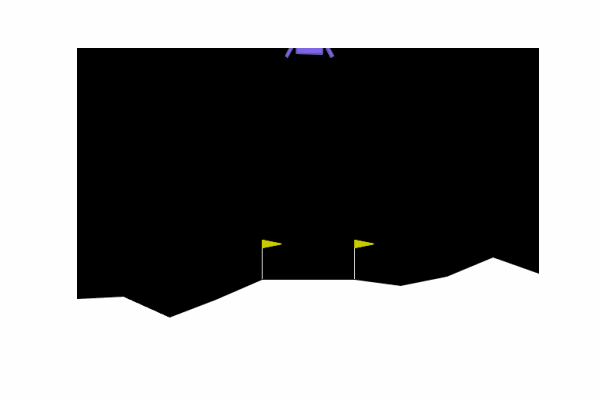

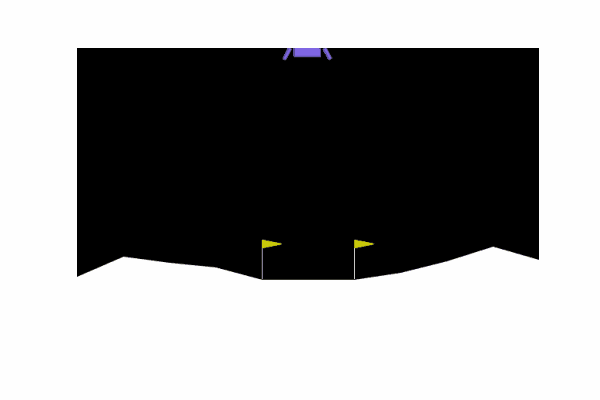

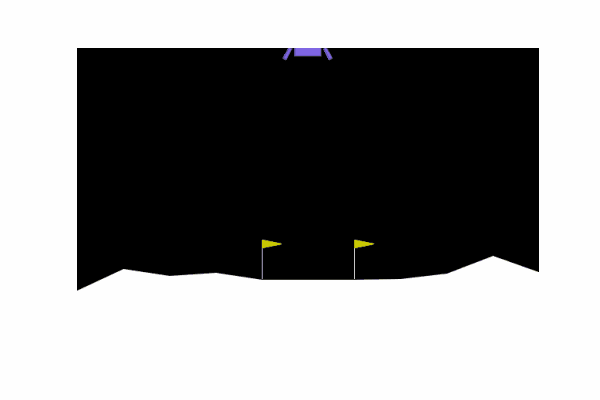

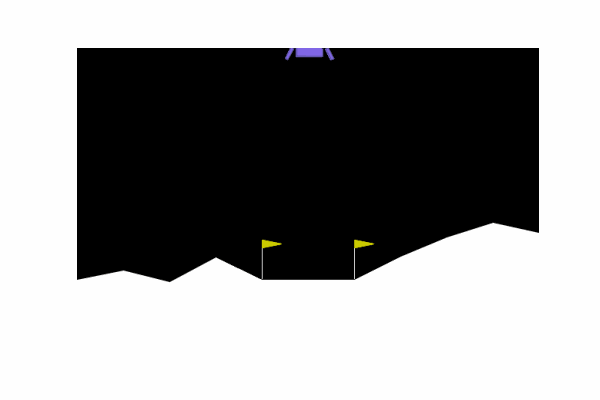

<ipython-input-135-cbb0e8e91d52>:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  q_values = policy(torch.tensor(state, dtype=torch.float32))


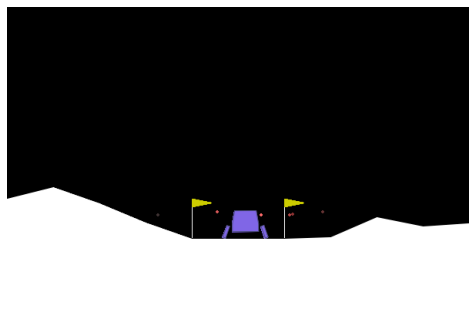

In [ ]:
from matplotlib import animation
import gymnasium as gym

def save_frames_as_gif(frames, path='./images/Cartpole_DQL/', filename='Cartpole_DQL.gif'):

    #Mess with this to change frame size
    plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi=72)

    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames = len(frames), interval=400)
    anim.save(path + filename, writer='imagemagick', fps=60)

def select_action(state, policy):
    if random.random() < 0.05:
        return env.action_space.sample()
    q_values = policy(torch.tensor(state, dtype=torch.float32))
    return torch.argmax(q_values).item()

env_render = gym.make('LunarLander-v2', render_mode='rgb_array')
state_dim = env_render.observation_space.shape[0]
action_dim = env_render.action_space.n
policy = DQN(state_dim, action_dim)
PATH = '/content/drive/MyDrive/LaboratoryDLA/LAB3/DQN3.pt'
policy.load_state_dict(torch.load(PATH))

# Run the env
env_render = gym.make('LunarLander-v2', render_mode='rgb_array')

# Run the env
state, info = env_render.reset()
frames = []
for t in range(250):
    # Render to frames buffer
    frames.append(env_render.render())
    state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
    action = select_action(state, policy)
    state, _, terminated, truncated, _ = env_render.step(action)
    if terminated or truncated:
        print(t)
        break
env_render.close()
save_frames_as_gif(frames, path='', filename='/content/drive/MyDrive/LaboratoryDLA/LAB3/lunar_24.gif')
